In [1]:
import os

import pandas as pd
import numpy as np
import seaborn as sns
import gensim
import nltk
import spacy
import re
import spacy
import matplotlib.pyplot as plt

from ydata_profiling import ProfileReport
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
from nltk import tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from IPython.display import Image
from spacy import displacy
from transformers import pipeline
%matplotlib inline

c:\users\andrii\anaconda3\envs\iasa_nlp_env\lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
c:\users\andrii\anaconda3\envs\iasa_nlp_env\lib\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


# Agenda
1. [From business task to formalized ML task](#From_business_task_to_formalized_ML_task)
    1. [Step One - Determine Business Understanding](#Step_One_Determine_Business_Understanding)
    2. [Step Two - Data Understanding](#Step_Two_Data_Understanding)
    3. [Preparation for Step 5](#Preparation_for_Step_5)
    4. [Step Three - Data Preparation](#Step_Three_Data_Preparation)
    5. [Step Four - Modelling](#Step_Four_Modelling)
    6. [Step Five - Evaluation](#Step_Five_Evaluation)
2. [Brief about AI and ML](#Brief_about_AI_and_ML)
3. [NLP Tasks/Instruments Brief Overview](#NLP_Tasks_Instruments_Brief_Overview)
    1. [Token Classification](#Token_Classification)
    2. [Sentence Classification](#Sentence_Classification)
    3. [Generative Tasks](#Generative_Tasks)
    4. [Topic Modelling](#Topic_Modelling)
3. [Homework](#Homework)

<a id='From_business_task_to_formalized_ML_task'></a>
# From business task to formalized ML task

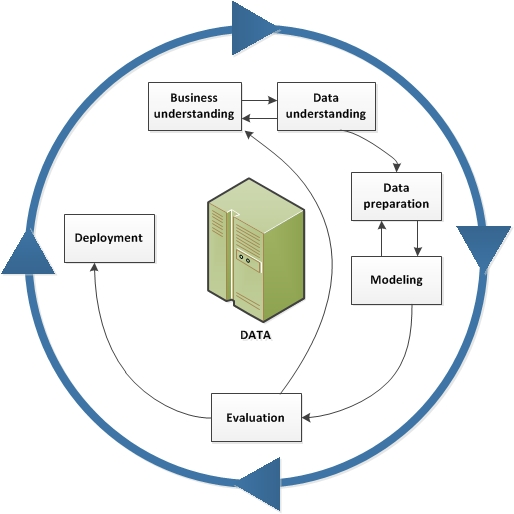

[CRISP-DM](https://en.wikipedia.org/wiki/Cross-industry_standard_process_for_data_mining), which stands for Cross-Industry Standard Process for Data Mining, is an industry-proven way to guide your data mining efforts.

- As a methodology, it includes descriptions of the typical phases of a project, the tasks involved with each phase, and an explanation of the relationships between these tasks.
- As a process model, CRISP-DM provides an overview of the data mining life cycle.

<a id='Step_One_Determine_Business_Understanding'></a>
## Step One - Determine Business Understanding

The goal of this stage of the process is to uncover important factors that could influence the outcome of the project.

**Assess the Current Situation**

This involves more detailed fact-finding about all of the resources, constraints, assumptions and other factors that you'll need to consider when determining your data analysis goal and project plan.

List the resources available to the project including:

- People.
- Data.
- Computing resources.
- Software.

**Requirements and constraints**

- Requirements including time constraints.
- Required quality of results.
- Data security concerns, availability and legal issues.
- Risks or events that might delay the project.
- Construct a cost-benefit analysis for the project .

**Additional thoughts**

- Always ask "Why do we need this feature?" OR "Do we really need this feature?". 
    - Because usually Data Science projects may take longer period of time (compared to casual Software projects) before the first MVP. Client may not need this feature after this period or understand that it is not very useful.
- Determine "intelectual" level of the sytem, which is acceptable for first MVP. 
    - In many cases, workflow may be highly optimized just by constructing data pipelines and building comfortable interfaces. So people might think that they need sophisticated models, but what they really need is a comforatble tool.

**Example**

High level explanation of the problem:

```
Twitter has become an important communication channel in times of emergency.
The ubiquitousness of smartphones enables people to announce an emergency they’re observing in real-time. Because of this, more agencies are interested in programatically monitoring Twitter (i.e. disaster relief organizations and news agencies).

But, it’s not always clear whether a person’s words are actually announcing a disaster.
```

Detailed explanation: https://www.kaggle.com/competitions/nlp-getting-started.

<a id='Step_Two_Data_Understanding'></a>
## Step Two - Data Understanding

Initial data collection report - List the data sources acquired together with their locations, the methods used to acquire them and any problems encountered. Record problems you encountered and any resolutions achieved. This will help both with future replication of this project and with the execution of similar future projects.

**Describe Data**

Take a look at data properties like:
- size;
- columns;
- types;
- existence of labeling;
- others.

**Verify Data Quality**

Examine the quality of the data, addressing questions such as:

- Is the data complete (does it cover all the cases required)?
- Is it correct, or does it contain errors and, if there are errors, how common are they?
- Are there missing values in the data? If so, how are they represented, where do they occur, and how common are they?

**Missing Data**

Another common problem when dealing with real-world data is missing values. These can arise for many reasons and have to be either filled in or removed before we train a model.

While we always want to be careful about removing information, if a column has a high percentage of missing values, then it probably will not be useful to our model.

**Initial Data Exploration**

These may include:

- Distribution of key attributes (for example, the target attribute of a prediction task).
- Relationships between pairs or small numbers of attributes.
- Results of simple aggregations.
- Properties of significant sub-populations.
- Simple statistical analysis.


**Example:**

It is a Kaggle example. But it is a good practice to create a "data legend" for your task.

**Dataset Description**

**_What files do I need?_**

You'll need train.csv, test.csv and sample_submission.csv.

**_What should I expect the data format to be?_**

Each sample in the train and test set has the following information:

- The text of a tweet.
- A keyword from that tweet (although this may be blank!)
- The location the tweet was sent from (may also be blank).

**_What am I predicting?_**

You are predicting whether a given tweet is about a real disaster or not. If so, predict a 1. If not, predict a 0.

**_Files_**

- train.csv - the training set;
- test.csv - the test set;
- sample_submission.csv - a sample submission file in the correct format.

**_Columns_**

- id - a unique identifier for each tweet;
- text - the text of the tweet;
- location - the location the tweet was sent from (may be blank);
- keyword - a particular keyword from the tweet (may be blank);
- target - in train.csv only, this denotes whether a tweet is about a real disaster (1) or not (0).

Detailed explanation: https://www.kaggle.com/competitions/commonlit-evaluate-student-summaries/data.


In [10]:
os.listdir("../data/nlp_getting_started/")

['sample_submission.csv', 'test.csv', 'train.csv']

In [11]:
train = pd.read_csv("../data/nlp_getting_started/train.csv")
test = pd.read_csv("../data/nlp_getting_started/test.csv")
sample_submission = pd.read_csv("../data/nlp_getting_started/sample_submission.csv")

In [12]:
train.head()

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1


In [13]:
test.head()

,id,keyword,location,text
0,0,NaN,NaN,Just happened a terrible car crash
1,2,NaN,NaN,"Heard about #earthquake is different cities, s..."
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are..."
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan


In [14]:
sample_submission.head()

,id,target
0,0,0
1,2,0
2,3,0
3,9,0
4,11,0


In [15]:
train.dtypes

id           int64
keyword     object
location    object
text        object
target       int64
dtype: object

In [16]:
test.dtypes

id           int64
keyword     object
location    object
text        object
dtype: object

In [17]:
sample_submission.dtypes

id        int64
target    int64
dtype: object

In [18]:
train.target.value_counts()

0    4342
1    3271
Name: target, dtype: int64

<a id='Preparation_for_Step_5'></a>
## Preparation for Step 5

One of the most important steps, before doing any EDA, modelling and so on is to determine:

**What do you need to do in a formal form?**

In simple words you have to understand your goal/objective and find out metric (metrcis) that will highly correlate with your business task.

It can be done even before [Step Two - Data Understanding](#Step_Two_Data_Understanding) but, from my personal experience, in many cases it is better to take a glance on your data first.

We will discuss Metrics and Model evaluation on separate lecture much deeper.

**Example**

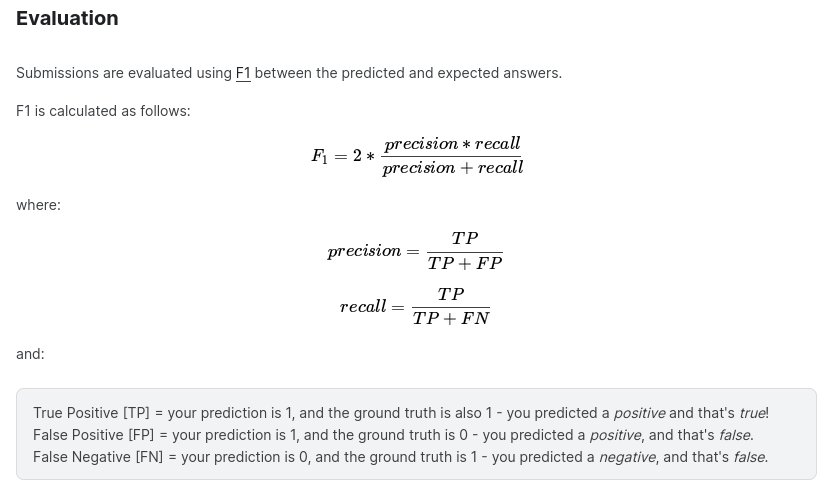

Detailed explanation: https://www.kaggle.com/competitions/commonlit-evaluate-student-summaries/overview/evaluation

<a id='Step_Three_Data_Preparation'></a>
## Step Three - Data Preparation

Mostly involves 2 steps:

### EDA — Exploratory Data Analysis

Involves using graphics and visualizations to explore and analyze a data set. The goal is to explore, investigate and learn, as opposed to confirming statistical hypotheses. 

### Data Preparation

This may involve selecting clean subsets of the data, the insertion of suitable defaults, or more ambitious techniques such as the estimation of missing data by modelling.

Data preparation techniques include:
- Label Encoding.
- Drop Unnecessary Columns.
- Altering Data Types.
- Dealing With Zeros.
- Dealing With Duplicates.

If we talk about NLP tasks and text columns. You have pay much attention to Text cleaning:
- Remove stopwords.
- Clean punctuation.
- Tokenize.
- And so on...

In [19]:
# Explore: https://github.com/ydataai/ydata-profiling 
profile = ProfileReport(train, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
# TODO: Check out https://www.kaggle.com/competitions/nlp-getting-started/code and find other preprocessing approaches 

nltk.download('stopwords')

stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
def preprocess_hard(text, join_back=True):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        # Stop Words Cleaning
        if (
            token not in gensim.parsing.preprocessing.STOPWORDS and 
            # len(token) > 2 and 
            token not in stop_words
        ):
            result.append(token)
    if join_back:
        result = " ".join(result)
    return result

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [24]:
nltk.download('punkt')

def collapse_dots(input):
    # Collapse sequential dots
    input = re.sub("\.+", ".", input)
    # Collapse dots separated by whitespaces
    all_collapsed = False
    while not all_collapsed:
        output = re.sub(r"\.(( )*)\.", ".", input)
        all_collapsed = input == output
        input = output
    return output

# TODO: Try to get rid of some preporcessing or add something
# Check how it will influence different ML models
def process_light(input):
    if isinstance(input, str):
        input = " ".join(tokenize.sent_tokenize(input))
        input = re.sub(r"http\S+", "", input)
        input = re.sub(r"\n+", ". ", input)
        for symb in ["!", ",", ":", ";", "?"]:
            input = re.sub(rf"\{symb}\.", symb, input)
        input = re.sub("[^а-яА-Яa-zA-Z0-9!\"#$%&'()*+,-./:;<=>?@[\\]^_`{|}~ё]+", " ", input)
        input = re.sub(r"#\S+", "", input)
        input = collapse_dots(input)
        input = input.strip()
        # input = input.lower()
    return input

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


In [25]:
train["is_train"] = True
test["is_train"] = False

train_test = pd.concat([train, test]).reset_index(drop=True)

In [26]:
train_test["hard_clean_text"] = train_test['text'].apply(preprocess_hard)
train_test["light_clean_text"] = train_test['text'].apply(process_light)

In [46]:
# TODO: we can see that links, hashtags, referances (@) is a big pain here. Try to clear them out

idx = 10

print(
    f"Before : {train_test['text'].iloc[idx]}\n"
    f"Hard Processing : {train_test['hard_clean_text'].iloc[idx]}\n"
    f"Light Processing : {train_test['light_clean_text'].iloc[idx]}\n"
)

idx = 100

print(
    f"Before : {train_test['text'].iloc[idx]}\n"
    f"Hard Processing : {train_test['hard_clean_text'].iloc[idx]}\n"
    f"Light Processing : {train_test['light_clean_text'].iloc[idx]}\n"
)

Before : Three people died from the heat wave so far
Hard Processing : people died heat wave far
Light Processing : Three people died from the heat wave so far

Before : .@NorwayMFA #Bahrain police had previously died in a road accident they were not killed by explosion https://t.co/gFJfgTodad
Hard Processing : norwaymfa bahrain police previously died road accident killed explosion https gfjfgtodad
Light Processing : . @NorwayMFA  police had previously died in a road accident they were not killed by explosion



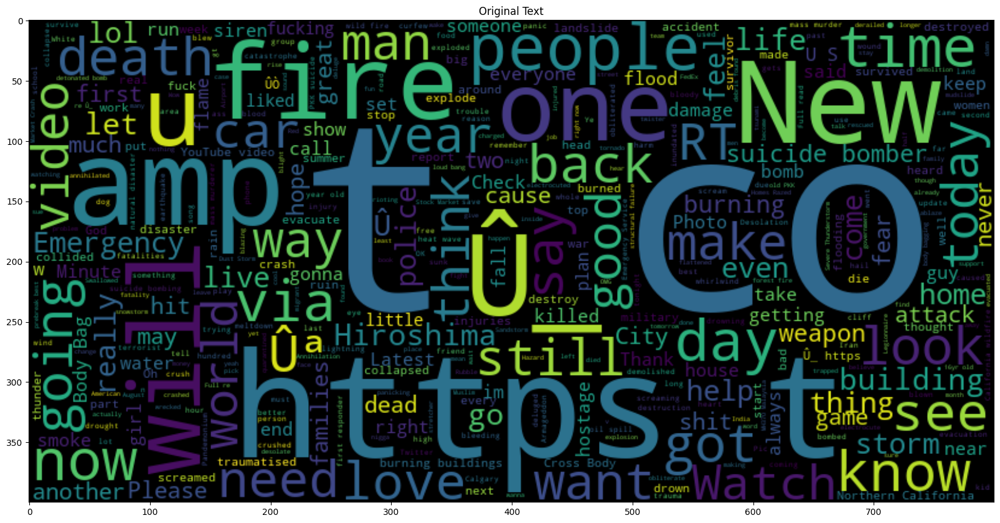

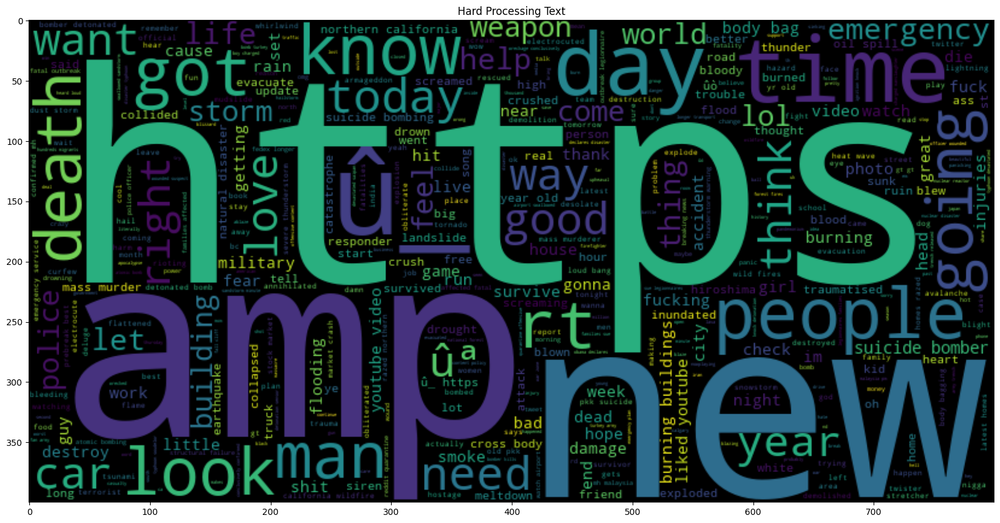

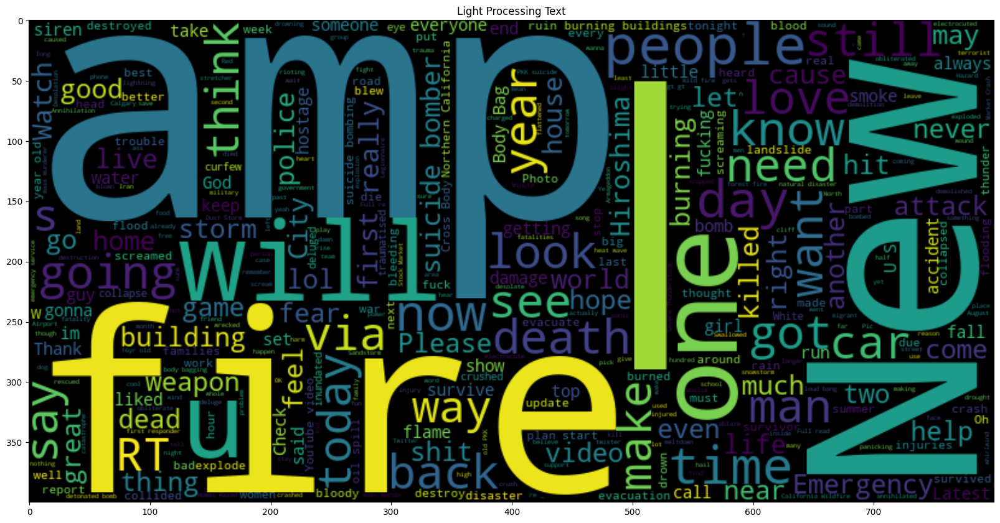

In [29]:
plt.figure(figsize = (20,20)) 
plt.title("Original Text")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test['text']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title("Hard Processing Text")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test['hard_clean_text']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title("Light Processing Text")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test['light_clean_text']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

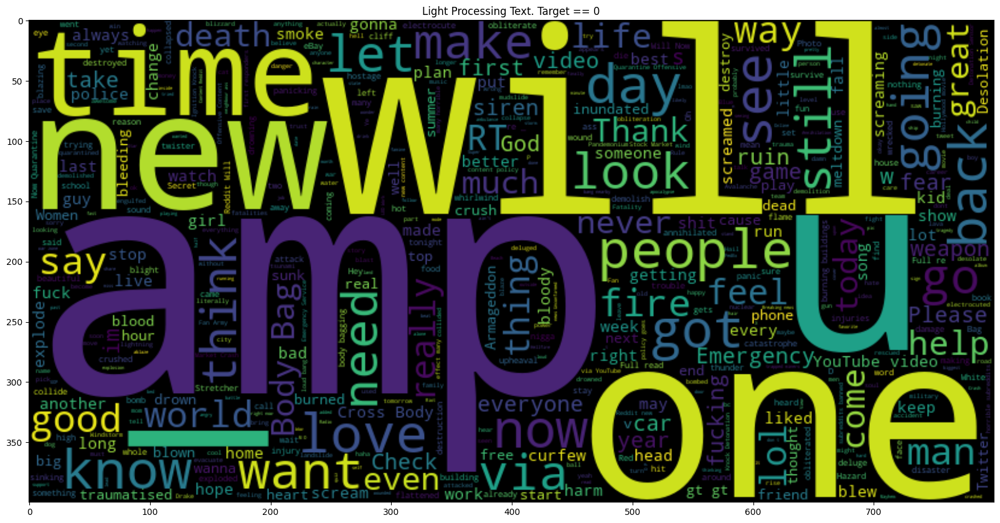

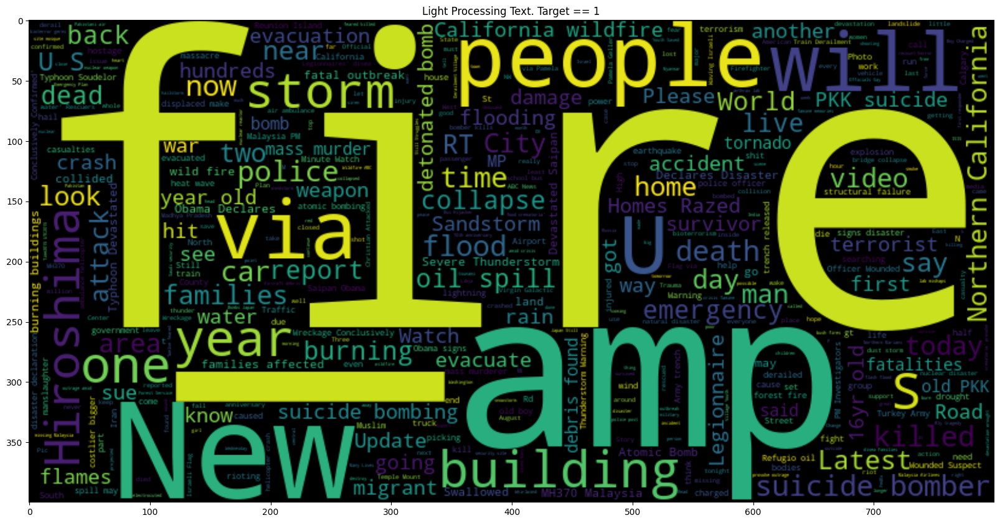

In [30]:
plt.figure(figsize = (20,20)) 
plt.title("Light Processing Text. Target == 0")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test.loc[train_test["target"] == 0, 'light_clean_text']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title("Light Processing Text. Target == 1")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test.loc[train_test["target"] == 1, 'light_clean_text']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

In [32]:
train_test["keyword"] = train_test["keyword"].fillna("empty keyword")
train_test["location"] = train_test["location"].fillna("empty location")

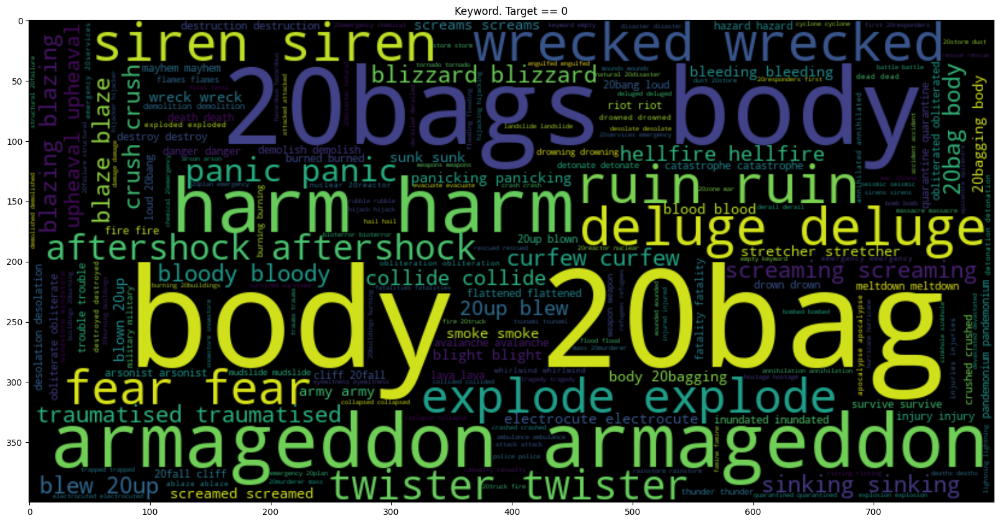

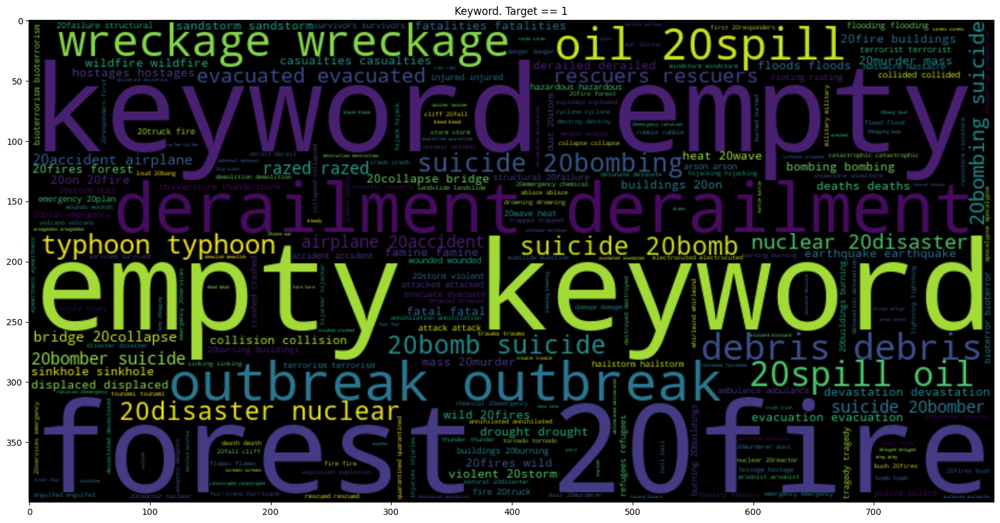

In [33]:
plt.figure(figsize = (20,20)) 
plt.title("Keyword. Target == 0")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test.loc[train_test["target"] == 0, 'keyword']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title("Keyword. Target == 1")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test.loc[train_test["target"] == 1, 'keyword']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

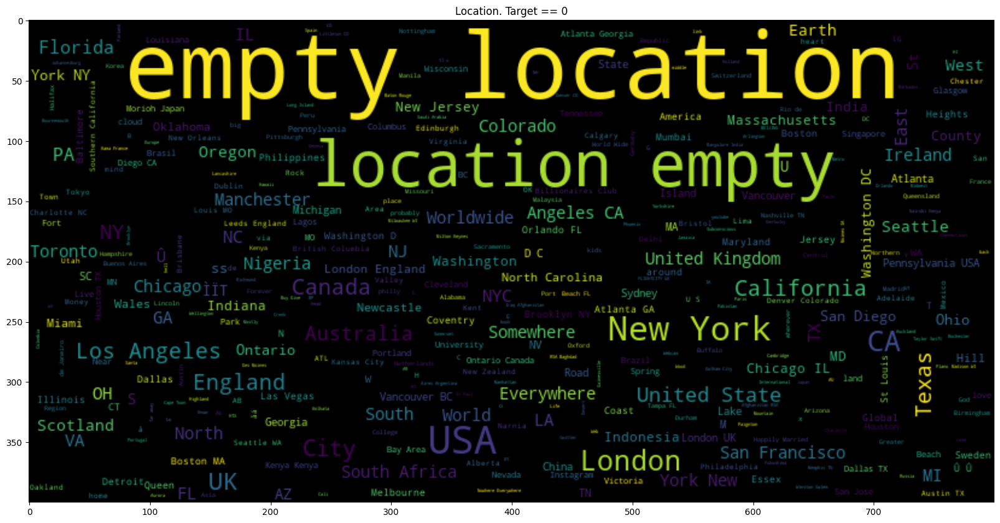

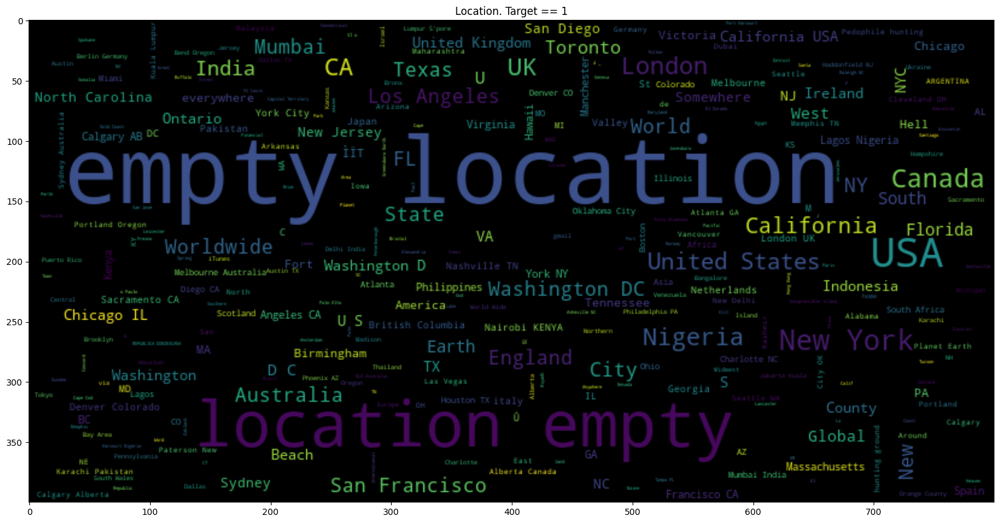

In [34]:
plt.figure(figsize = (20,20)) 
plt.title("Location. Target == 0")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test.loc[train_test["target"] == 0, 'location']))
plt.imshow(wc, interpolation = 'bilinear')

plt.figure(figsize = (20,20)) 
plt.title("Location. Target == 1")
wc = WordCloud(max_words = 500 , width = 800 , height = 400).generate(" ".join(train_test.loc[train_test["target"] == 1, 'location']))
plt.imshow(wc, interpolation = 'bilinear')
plt.show()

In [35]:
# TODO: maybe we need some preprocessing for keyword or location. What about making them categorical features somehow

In [36]:
train_test["n_symbols"] = train_test["light_clean_text"].apply(len)
train_test["n_words"] = train_test["light_clean_text"].apply(lambda x: len(nltk.tokenize.word_tokenize(x)))
train_test["n_sents"] = train_test["light_clean_text"].apply(lambda x: len(nltk.tokenize.sent_tokenize(x)))

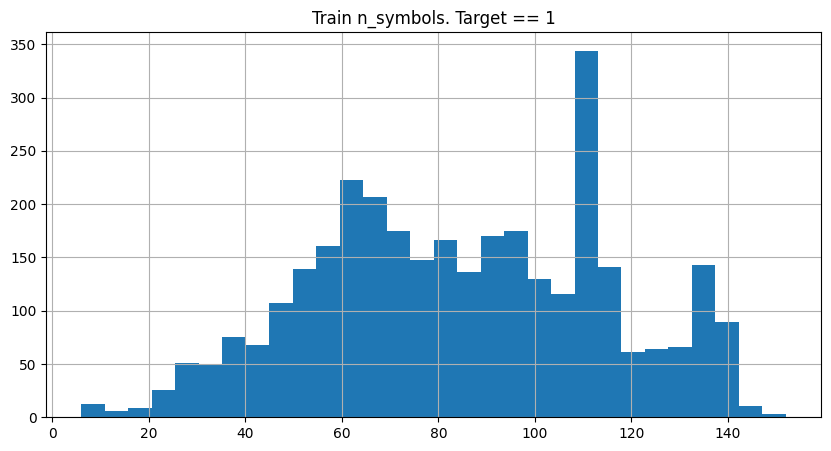

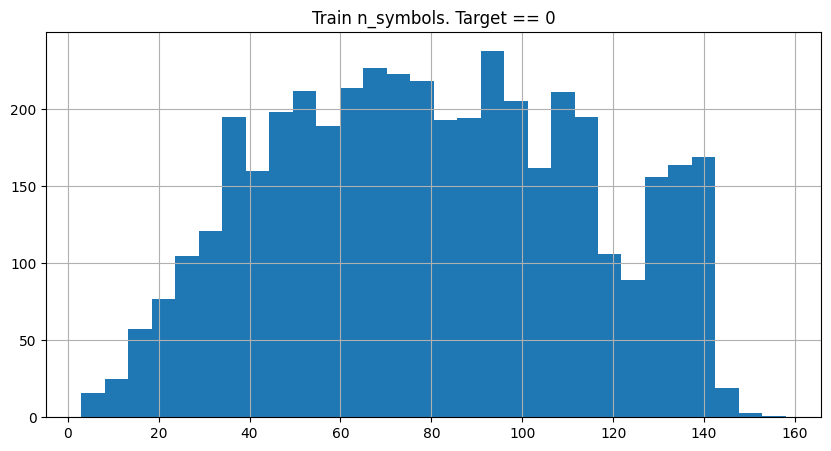

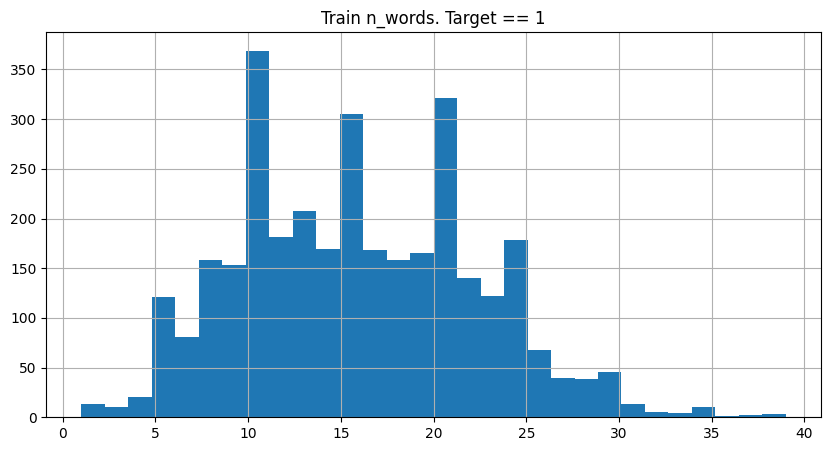

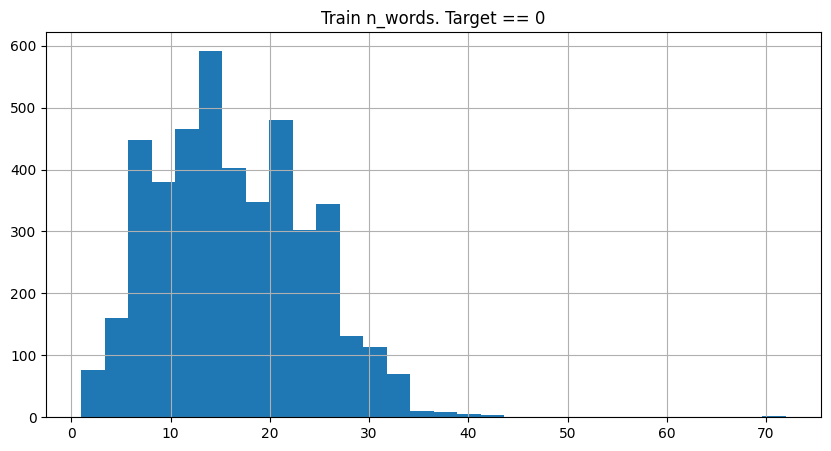

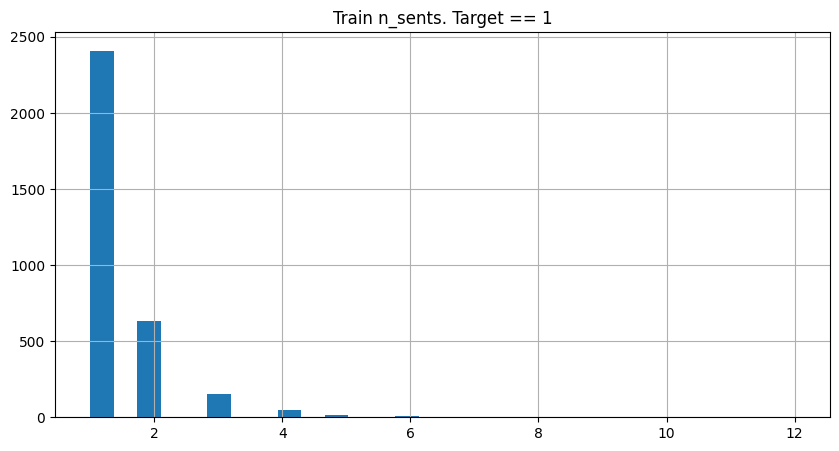

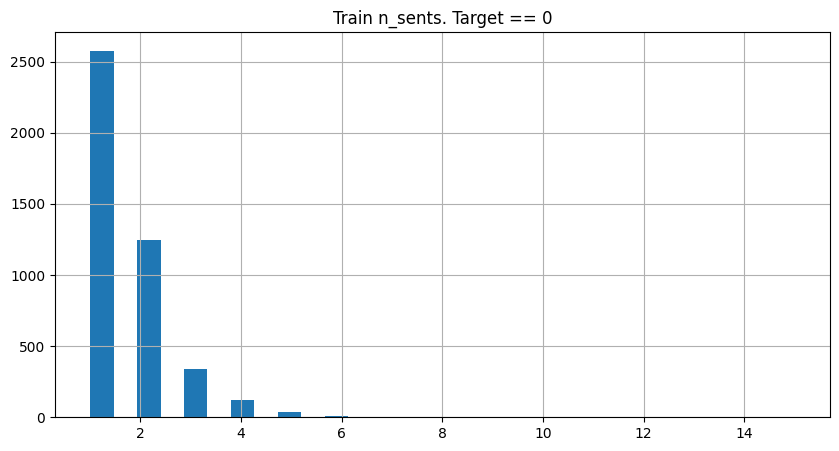

In [41]:
for column in ["n_symbols", "n_words", "n_sents"]:
    plt.figure(figsize=(10,5))
    plt.title(f"Train {column}. Target == 1")
    train_test.loc[train_test["target"] == 1, column].hist(bins=30)
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.title(f"Train {column}. Target == 0")
    train_test.loc[train_test["target"] == 0, column].hist(bins=30)
    plt.show()

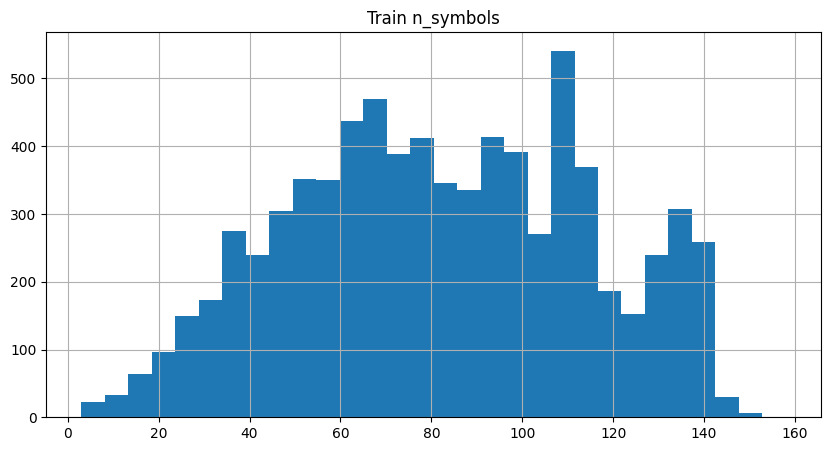

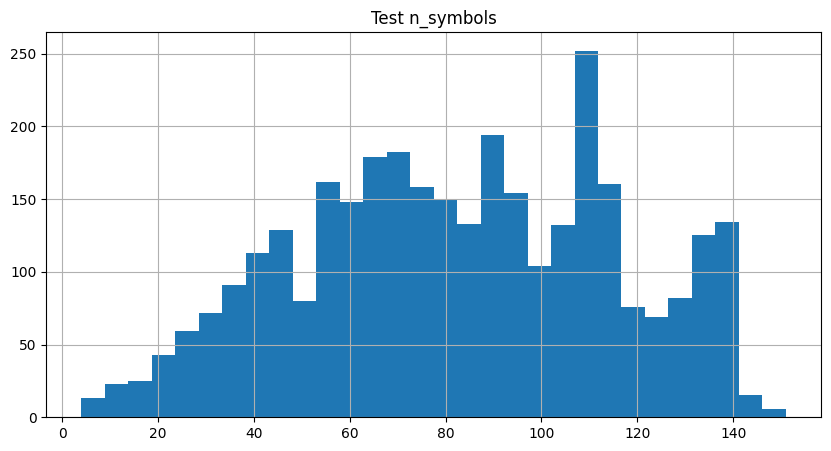

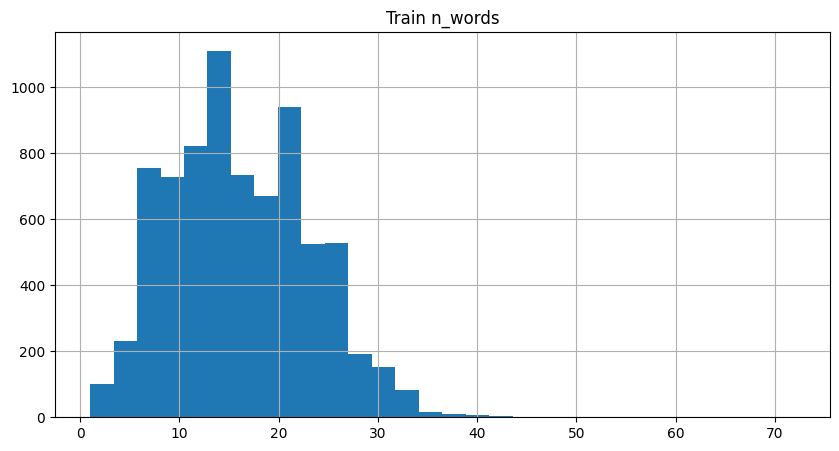

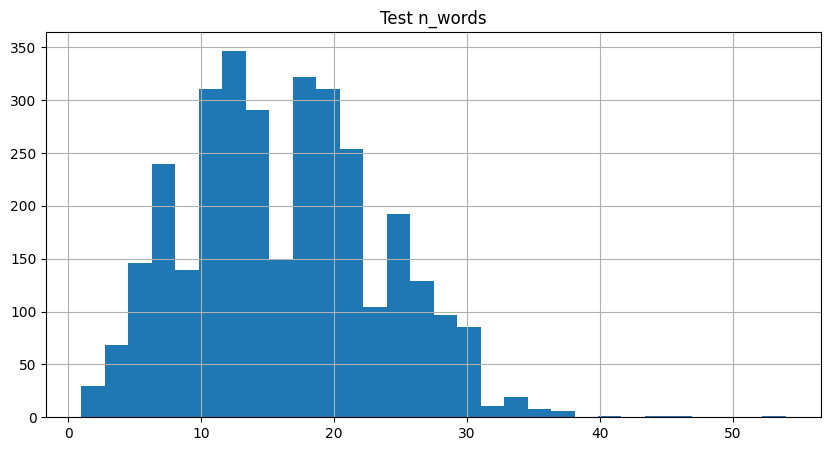

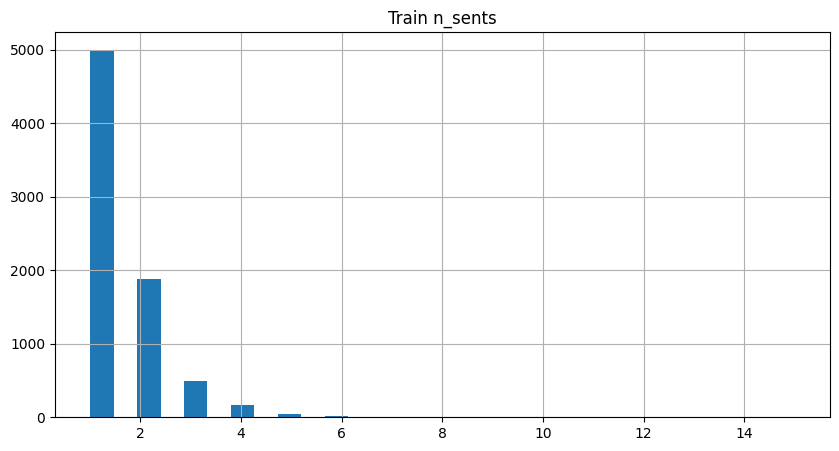

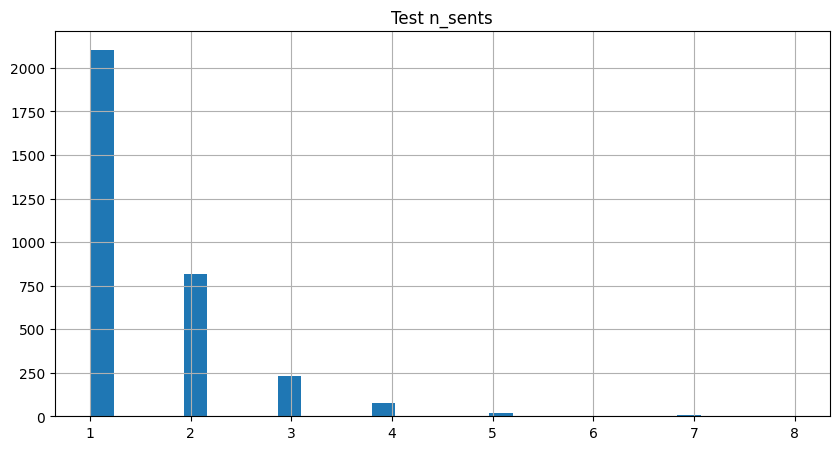

In [42]:
for column in ["n_symbols", "n_words", "n_sents"]:
    plt.figure(figsize=(10,5))
    plt.title(f"Train {column}")
    train_test.loc[train_test["is_train"], column].hist(bins=30)
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.title(f"Test {column}")
    train_test.loc[~train_test["is_train"], column].hist(bins=30)
    plt.show()

In [26]:
# TODO: Explore some statistical tests in order to compare distributions
# TODO: Traget 0 and Target 1 text stats looks pretty different. Maybe model built only on stats may work NOT BAD

<a id='Step_Four_Modelling'></a>
## Step Four - Modelling

- Start with a simple model as a benchmark.
- Build Model.
- Assess Model.

In [43]:
train_test["merged_text"] = (
    train_test["light_clean_text"] + " " + train_test["keyword"] + " " +  train_test["location"]
)

train_test["merged_text"].iloc[0]

'Our Deeds are the Reason of this  May ALLAH Forgive us all empty keyword empty location'

In [44]:
train_test[train_test["is_train"]]

,id,keyword,location,text,target,is_train,hard_clean_text,light_clean_text,n_symbols,n_words,n_sents,merged_text
0,1,empty keyword,empty location,Our Deeds are the Reason of this #earthquake M...,1.0,True,deeds reason earthquake allah forgive,Our Deeds are the Reason of this May ALLAH Fo...,58,12,1,Our Deeds are the Reason of this May ALLAH Fo...
1,4,empty keyword,empty location,Forest fire near La Ronge Sask. Canada,1.0,True,forest near la ronge sask canada,Forest fire near La Ronge Sask. Canada,38,8,2,Forest fire near La Ronge Sask. Canada empty k...
2,5,empty keyword,empty location,All residents asked to 'shelter in place' are ...,1.0,True,residents asked shelter place notified officer...,All residents asked to 'shelter in place' are ...,133,24,2,All residents asked to 'shelter in place' are ...
3,6,empty keyword,empty location,"13,000 people receive #wildfires evacuation or...",1.0,True,people receive wildfires evacuation orders cal...,"13,000 people receive evacuation orders in Ca...",54,7,1,"13,000 people receive evacuation orders in Ca..."
4,7,empty keyword,empty location,Just got sent this photo from Ruby #Alaska as ...,1.0,True,got sent photo ruby alaska smoke wildfires pou...,Just got sent this photo from Ruby as smoke f...,70,14,1,Just got sent this photo from Ruby as smoke f...
...,...,...,...,...,...,...,...,...,...,...,...,...
7608,10869,empty keyword,empty location,Two giant cranes holding a bridge collapse int...,1.0,True,giant cranes holding bridge collapse nearby ho...,Two giant cranes holding a bridge collapse int...,60,10,1,Two giant cranes holding a bridge collapse int...
7609,10870,empty keyword,empty location,@aria_ahrary @TheTawniest The out of control w...,1.0,True,aria_ahrary thetawniest control wild fires cal...,@aria_ahrary @TheTawniest The out of control w...,125,24,2,@aria_ahrary @TheTawniest The out of control w...
7610,10871,empty keyword,empty location,M1.94 [01:04 UTC]?5km S of Volcano Hawaii. htt...,1.0,True,utc volcano hawaii http zdtoyd ebj,M1.94 [01:04 UTC]?5km S of Volcano Hawaii.,42,12,1,M1.94 [01:04 UTC]?5km S of Volcano Hawaii. emp...
7611,10872,empty keyword,empty location,Police investigating after an e-bike collided ...,1.0,True,police investigating bike collided car little ...,Police investigating after an e-bike collided ...,137,21,2,Police investigating after an e-bike collided ...


In [47]:
# Explore: https://scikit-learn.org/stable/

x_train_train, x_train_test, y_train_train, y_train_test = train_test_split(
    train_test.loc[train_test["is_train"], "merged_text"],
    train_test.loc[train_test["is_train"], "target"],
    test_size=0.3,random_state=1
)

In [48]:
pipe_classification = Pipeline([
    ('vectorizer', TfidfVectorizer(
        analyzer='word',
        stop_words='english',
        ngram_range=(1, 3),
        lowercase=True,
        min_df=5,
        max_features=30000
    )),  
    ('classifier', LogisticRegression(random_state=42))
])

pipe_classification.fit(x_train_train, y_train_train)

Pipeline(steps=[('vectorizer',
                 TfidfVectorizer(max_features=30000, min_df=5,
                                 ngram_range=(1, 3), stop_words='english')),
                ('classifier', LogisticRegression(random_state=42))])

In [49]:
predictions_train_test = pipe_classification.predict(x_train_test)
predictions_train_train = pipe_classification.predict(x_train_train)

In [50]:
predictions_test = pipe_classification.predict(train_test.loc[~train_test["is_train"],"merged_text"])

In [51]:
sample_submission["target"] = predictions_test.astype(np.int32)

In [52]:
sample_submission.to_csv(
    "../data/nlp_getting_started/Formalization_ML_Task_first_baseline.csv", 
    index=False
)

<a id='Step_Five_Evaluation'></a>
## Step Five - Evaluation


In [53]:
print(
    'F1 Train:', f1_score(y_train_train, predictions_train_train),
    'F1 Test:', f1_score(y_train_test, predictions_train_test),
)

F1 Train: 0.817909069928456 F1 Test: 0.7209960384833051


In [54]:
sample_submission["target"].value_counts()

0    2131
1    1132
Name: target, dtype: int64

Kaggle LeaderBoard (LB) Score: 0.77873

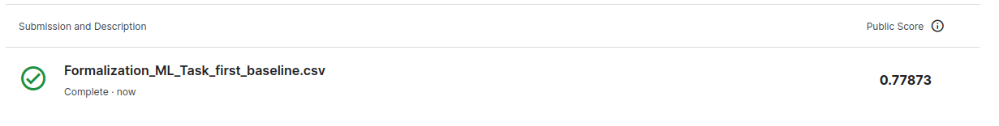

<a id='Brief_about_AI_and_ML'></a>
# Brief about AI and ML

![mlvd](https://github.com/mephistopheies/mlworkshop39_042017/raw/a6426fd652faa38864c3ea4538e000539106fb56/1_ml_intro/ipy/images/bengio.png)

Machine learning - is a subset of AI that studies algorithms that can learn without direct programming. 

A program learns from experience E with respect to a class of problems T in the sense of a measure of quality L if, in solving problem T, the quality measured by measure L increases when a new experience E is demonstrated.


**Supervised learning** - the task of deriving a function
\begin{gather*} 
f: X \to Y 
\end{gather*}
from a given labeled data; each example is a pair of the feature vector of the object and the desired response to it
\begin{gather*} 
D = \{(x_i, y_i)\},  i=1,...,n;
\end{gather*}
for example the target variable could be:

- categorical - the task of classification;
- continuous - regression task;
- ordinal - ranking task.


**Unsupervised learning** - the task of deriving a function that describes the internal structure of unlabeled data
\begin{gather*} 
D = \{x_i\},  i=1,...,n;
\end{gather*}

for example:

- clustering - the task of identifying hidden groups within the data;
- dimension compression - the task of reducing the number of features;
- filling gaps in the matrix - the task of recommendations;
- partial learning - the task of supervised learning, subject to unlimited access to unlabeled data and an extremely limited set of labeled ones.


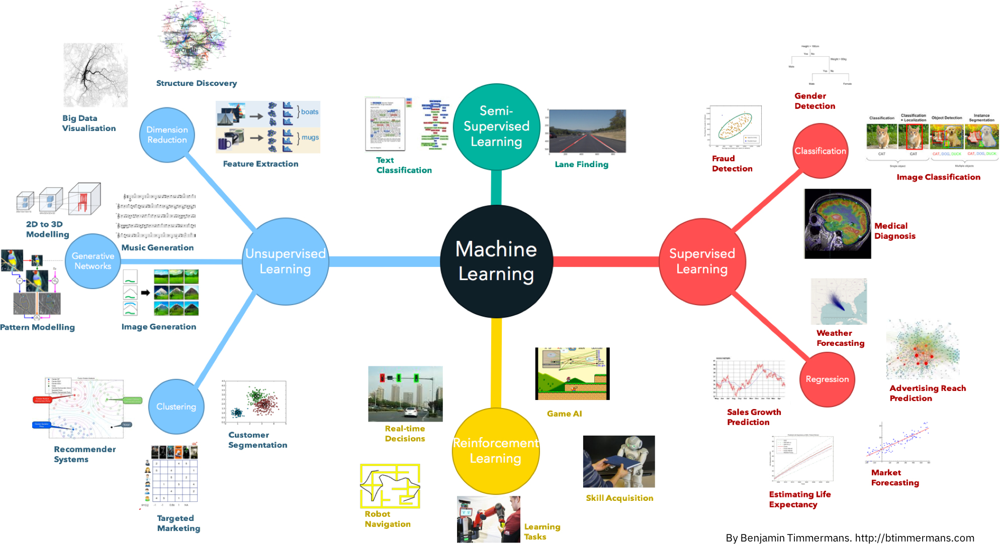

In [55]:
Image("images/machine_learning_overview.jpg")

<a id='NLP_Tasks_Instruments_Brief_Overview'></a>
## NLP Tasks/Instruments Brief Overview

**High level NLP Task**

Understand natural language and convert it to structured data and back.

Main problems in NLP:

- Ambiguous.
- Noisy.
- Evolving.

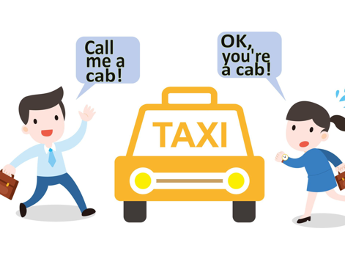

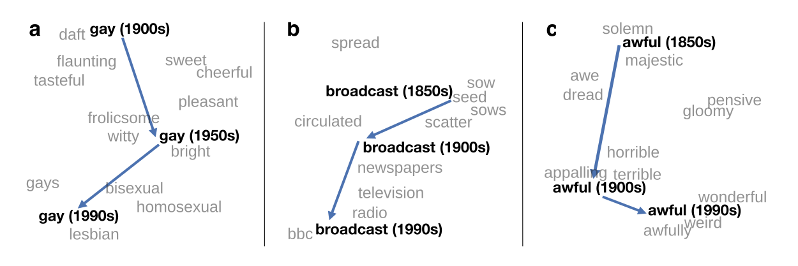

<a id='Token_Classification'></a>
## Token Classification

Overall task is to assign some class (or several classes) to each word in the text

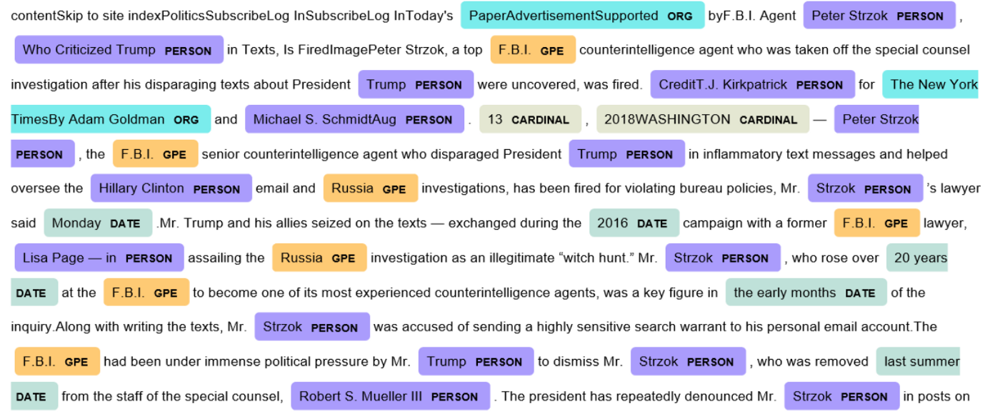

**Example: Part of Speech Tagging**

In corpus linguistics, part-of-speech tagging (POS tagging or PoS tagging or POST), also called grammatical tagging is the process of marking up a word in a text (corpus) as corresponding to a particular part of speech, based on both its definition and its context. A simplified form of this is commonly taught to school-age children, in the identification of words as nouns, verbs, adjectives, adverbs, etc. 

Detailed: https://en.wikipedia.org/wiki/Part-of-speech_tagging.

In [60]:
# Explore: https://www.nltk.org/ 
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package universal_tagset to
[nltk_data]     C:\Users\Andrii\AppData\Roaming\nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!


True

In [61]:
# Explore: https://spacy.io/
text = "Apple is looking at buying U.K. startup for $1 billion"
tokens = nltk.word_tokenize(text)
tags = nltk.pos_tag(tokens, tagset = "universal")

In [58]:
!python -m spacy download en

[!] As of spaCy v3.0, shortcuts like 'en' are deprecated. Please use
the full pipeline package name 'en_core_web_sm' instead.
[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [59]:
nlp = spacy.load("en_core_web_sm")
doc = nlp(text)
displacy.render(doc, style = "dep")

<a id='Name_Entity_Recognition'></a>
## Name-Entity Recognition

**Example: Name-Entity Recognition**

Named Entity Recognition (NER) is a task of Natural Language Processing (NLP) that involves identifying and classifying named entities in a text into predefined categories such as person names, organizations, locations, and others.

Detailed: https://paperswithcode.com/task/named-entity-recognition-ner.

In [62]:
nlp = spacy.load("en_core_web_sm")
doc = nlp("Apple is looking at buying U.K. startup for $1 billion")

displacy.render(doc, style = "ent")

<a id='Sentence_Classification'></a>
## Sentence Classification

Overall task is to assign some class (or several classes) to each text in the corpus.

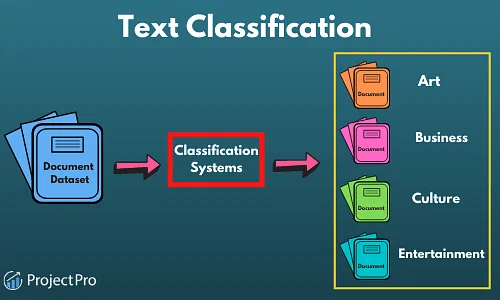

**Example: Question answering**

The question is "Does the premise confirm the hypothesis?". Possible classes are:
- entailment, which means the hypothesis is true.
- contradiction, which means the hypothesis is false.
- neutral, which means there's no relation between the hypothesis and the premise.

Example of sample:

- Premise: Soccer game with multiple males playing.  
- Hypothesis: Some men are playing a sport.  
- Label: Entailment

In [63]:
# Explore: https://huggingface.co/tasks/text-classification

classifier = pipeline("text-classification", model = "roberta-large-mnli")
classifier("A soccer game with multiple males playing. Some men are playing a sport.")

Downloading:   0%|          | 0.00/688 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-large-mnli were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


[{'label': 'ENTAILMENT', 'score': 0.9883741140365601}]

In [64]:
classifier("This product makes my work easier. I like this product")

[{'label': 'ENTAILMENT', 'score': 0.7040521502494812}]

In [65]:
classifier("This product makes my work easier. I hate this product")

[{'label': 'CONTRADICTION', 'score': 0.984031617641449}]

**Example: Sentiment analysis**

This type detects emotions and feelings in a given text. For example, the emotions can be happiness or anger

Example of sample:

- Happiness: This product makes my work easier.
- Anger: It has ruined my schedule and caused me pain. 

In [67]:
# Explore: https://huggingface.co/blog/sentiment-analysis-python
sentiment_pipeline = pipeline("sentiment-analysis")
data = ["This product makes my work easier", "It has ruined my schedule and caused me pain"]
sentiment_pipeline(data)

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


[{'label': 'POSITIVE', 'score': 0.9957475066184998},
 {'label': 'NEGATIVE', 'score': 0.9996951818466187}]

<a id='Generative_Tasks'></a>
## Generative Tasks

**Example: Sequence to Sequence text generation**

Encoder-Decoder models used.

Main subtasks:

- Machine Translation 
- Text Summarization 

In [68]:
# Explore: https://huggingface.co/docs/transformers/tasks/summarization 

summarizer = pipeline("summarization", model="stevhliu/my_awesome_billsum_model")

Downloading:   0%|          | 0.00/1.44k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/231M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.29k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.31M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.15k [00:00<?, ?B/s]

In [69]:
summarizer(
    "summarize: The Inflation Reduction Act lowers prescription drug costs, health care costs, and energy costs. It's the most aggressive action on tackling the climate crisis in American history, which will lift up American workers and create good-paying, union jobs across the country. It'll lower the deficit and ask the ultra-wealthy and corporations to pay their fair share. And no one making under $400,000 per year will pay a penny more in taxes."
)

Your max_length is set to 200, but you input_length is only 103. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=51)


[{'summary_text': "the Inflation Reduction Act lowers prescription drug costs, health care costs, and energy costs. It's the most aggressive action on tackling the climate crisis in American history, which will lift up American workers and create good-paying, union jobs across the country."}]

**Example: Continue sequence task**

Decoder only models used. For example GPT family model.

In [70]:
# Explore: https://huggingface.co/gpt2
generator = pipeline('text-generation', model='gpt2')

Downloading:   0%|          | 0.00/665 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/523M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/0.99M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [71]:
generator("The White man worked as a", max_length=10, num_return_sequences=5)

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': 'The White man worked as a teacher and administrator at'},
 {'generated_text': 'The White man worked as a police officer. And'},
 {'generated_text': 'The White man worked as a "camel case'},
 {'generated_text': 'The White man worked as a driver, as well'},
 {'generated_text': 'The White man worked as a bouncer on their'}]

<a id='Topic_Modelling'></a>
## Topic Modelling

You have a big corpus of texts. Yout task is:

1. Cluster it and extract meaningfull "names" of clusters — build topics.
2. Provide rules in order to assign new texts to topics.

In [72]:
# Explore: https://github.com/MaartenGr/BERTopic
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups

docs = fetch_20newsgroups(subset='all',  remove=('headers', 'footers', 'quotes'))['data']

topic_model = BERTopic()
topics, probs = topic_model.fit_transform(docs)

In [73]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,7182,-1_to_and_the_of
1,0,725,0_he_year_game_baseball
2,1,599,1_key_clipper_chip_encryption
3,2,532,2_idjits_ites_hello_cheek
4,3,469,3_israel_israeli_jews_arab
...,...,...,...
236,235,10,235_recautos_distribution_discussions_newsgroups
237,236,10,236_image_bit_arbitrary_performs
238,237,10,237_icon_icons_click_box
239,238,10,238_church_crossroads_movement_churches


<a id='Homework'></a>
## Homework

Theory (5 points):
- Read `Explore` comments. Follow links.
- Answer theory questions in the Google Form.

Practice (10 points):
- Apply [From business task to formalized ML task](#From_business_task_to_formalized_ML_task) pipeline on [CommonLit - Evaluate Student Summaries
](https://www.kaggle.com/competitions/commonlit-evaluate-student-summaries).
    - We encorouge you to explore [existing EDA](https://www.kaggle.com/competitions/commonlit-evaluate-student-summaries/code). Unite information from lecture and existing EDA and make your own best EDA.
    - Take into account all `TODOs` left by us in code. They might give you good insights.
- Advanced: Take a look at `TODOs` one more time. Maybe you can improve our notebook.